<a href="https://colab.research.google.com/github/OtolaHan/Otola_Han_KAAN/blob/main/Lab_M_03d.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание 3. Детекция объектов

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом, и точно не будет работать из коробки на Windows.

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [1]:
# Harry Potter -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip



!unzip -q data.zip

--2025-03-19 10:29:16--  https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip [following]
--2025-03-19 10:29:17--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17592727 (17M) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>]  16.78M  --.-KB/s    in 0.06s   

2025-03-19 10:29:19 (265 MB/s) - ‘data.zip’ saved [17592727/17592727]



# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

In [2]:
import torch
from xml.etree import ElementTree as ET
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2
from pathlib import Path
import glob
import numpy as np
from PIL import Image
import torchvision
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from torch import nn
import shutil
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

Функции можно и нужно передать некий class_dict. Он есть и при инициализации датасета ниже. С его помощью можно название класса превратить в int. Далее подразумевается, что класс идёт как int.

In [3]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # Получаем имя файла без расширения
    filename = image_name.split("/")[-1].split(".")[0]
    # Читаем XML-файл
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()

    bboxes = []
    for member in treeroot.findall("object"):
        # Извлекаем координаты bounding box
        bndbox = member.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)

        # Получаем класс объекта и преобразуем его в int
        class_name = member.find("name").text
        class_id = class_dict[class_name]

        # Добавляем bounding box и класс в список
        bboxes.append([xmin, ymin, xmax, ymax, class_id])

    return bboxes

In [4]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Разделение на обучающую и тестовую выборки
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        fname = self.filenames[idx]

        # Загружаем изображение
        image = np.array(Image.open(fname).convert("RGB"))

        # Получаем bounding boxes
        bboxes = get_xml_data(fname, self.root, self.class_dict)

        # Применяем трансформации
        transformed = self.transform(image=image, bboxes=bboxes)

        # Возвращаем изображение и bounding boxes
        return {"image": transformed['image'], "bboxes": transformed['bboxes']}

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [5]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [6]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

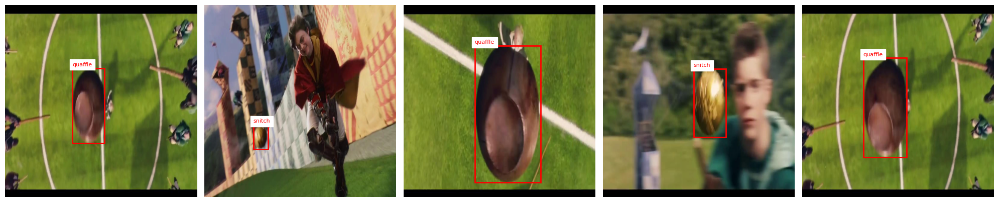

In [7]:
# Чтобы убедиться, что данные загружаются и обрабатываются корректно, визуализируем несколько изображений с bounding boxes:
def visualize_dataset(dataset, num_samples=5):
    fig, axes = plt.subplots(1, num_samples, figsize=(20, 5))
    for i in range(num_samples):
        sample = dataset[i]
        image = sample["image"].permute(1, 2, 0).numpy()
        image = image * np.array(std) + np.array(mean)  # Денормализация
        image = np.clip(image, 0, 1)  # Ограничиваем значения до [0, 1]

        axes[i].imshow(image)
        axes[i].axis("off")

        for bbox in sample["bboxes"]:
            xmin, ymin, xmax, ymax, class_id = bbox
            rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                            fill=False, color="red", linewidth=2)
            axes[i].add_patch(rect)
            axes[i].text(xmin, ymin - 5, dataset.class_dict_inv[class_id],
                         color="red", fontsize=8, backgroundcolor="white")

    plt.tight_layout()
    plt.show()

# Визуализируем обучающий датасет
visualize_dataset(train_ds)

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.

В датасете есть class_dict_inv, который позволит вам сделать обратное преобразование: int, содержащий класс, в строку с названием.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

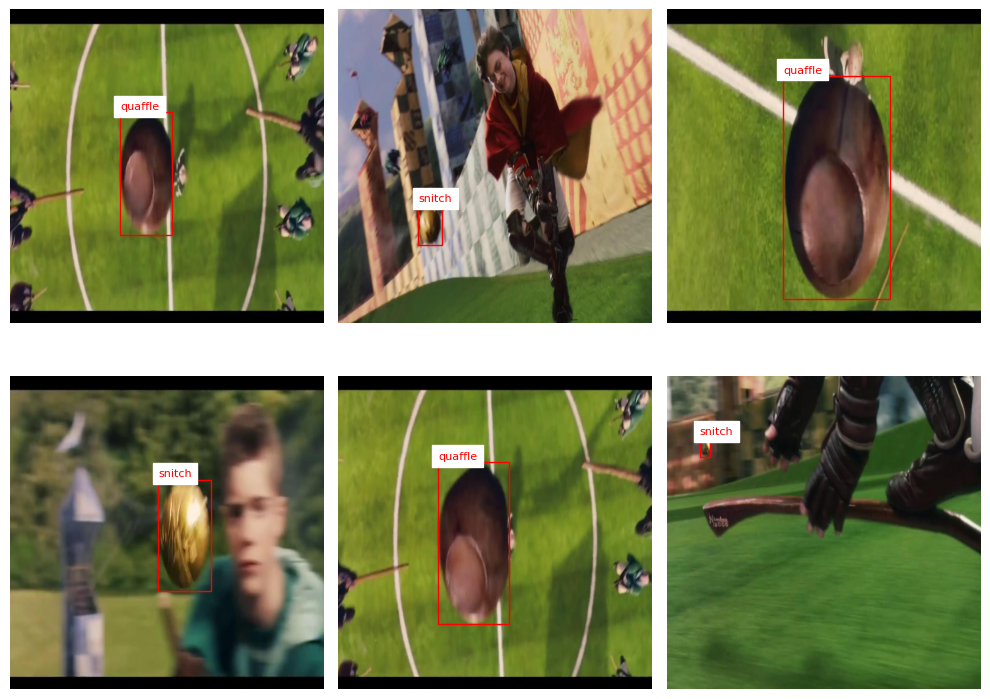

In [8]:
def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):
        ax.axis(False)

        if i >= len(images):
            break

        # Откатываем нормализацию
        image = images[i].permute(1, 2, 0).numpy()
        image = image * std + mean
        image = np.clip(image, 0, 1)  # Ограничиваем значения до [0, 1]

        ax.imshow(image)

        for bbox in bboxes[i]:
            xmin, ymin, xmax, ymax, class_id = bbox
            width = xmax - xmin
            height = ymax - ymin

            # Рисуем прямоугольник
            rect = Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # Добавляем текст с классом
            class_name = train_ds.class_dict_inv[int(class_id)]
            ax.text(xmin, ymin - 5, class_name, color='r', fontsize=8, backgroundcolor='white')

    fig.tight_layout()
    plt.show()

# Пример использования функции visualize
sample_images = []
sample_bboxes = []

# Выберем несколько изображений из train_ds для визуализации
for i in range(6):
    sample = train_ds[i]
    sample_images.append(sample['image'])
    sample_bboxes.append(sample['bboxes'])

visualize(sample_images, sample_bboxes)

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://gcdnb.pbrd.co/images/n8BnhhfCgYnQ.png)

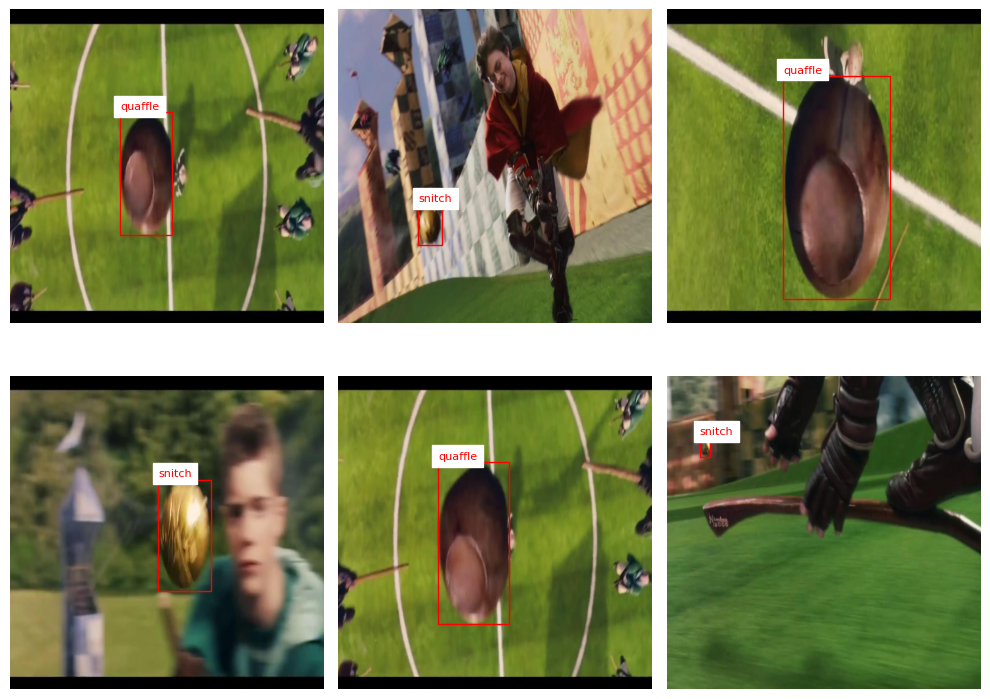

In [9]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

We convert lists of bounding boxes to the target downsampled grid. For this we

* compute centers of bounding boxes ($c_x, c_y$)
* change center coordinates (offset from the top left corner for each corresponding grid cell on a small grid)
* normalize box height and with to $[0, 1]$
* fill the target grid with values

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и сгенерировать тензор размера Bx16x16x6. Первая размерность - это количество примеров в батче. Далее идут две пространственные размерности, это сетка 16 на 16.

В каналах у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "пиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

In [10]:
def collate_fn(batch, downsample=32):
    """
    Функция для создания батча из данных.
    Возвращает словарь с изображениями и целевыми тензорами.
    """
    imgs, batch_boxes = map(list, zip(*[(b["image"], b["bboxes"]) for b in batch]))

    imgs = torch.stack(imgs)  # Собираем изображения в один тензор
    b, _, h, w = imgs.shape  # Размеры батча, высота и ширина изображений

    # Создаем целевой тензор размером [B, 6, 16, 16]
    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    for i, boxes in enumerate(batch_boxes):
        if len(boxes) == 0:
            continue  # Пропускаем изображения без bounding boxes

        # Преобразуем bounding boxes в тензор
        boxes_tensor = torch.tensor(boxes)  # [N, 5], где N — количество bounding boxes
        xmin, ymin, xmax, ymax, classes = boxes_tensor[:, 0], boxes_tensor[:, 1], boxes_tensor[:, 2], boxes_tensor[:, 3], boxes_tensor[:, 4]

        # Нормализация ширины и высоты
        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h

        # Координаты центра
        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2

        # Индексы клетки на карте 16x16
        cx_idx = (cx / downsample).long()  # Преобразуем в целые числа
        cy_idx = (cy / downsample).long()

        # Сдвиги относительно клетки
        cx_box = (cx % downsample) / downsample
        cy_box = (cy % downsample) / downsample

        # Записываем данные в target
        for j in range(len(boxes)):
            target[i, :, cy_idx[j], cx_idx[j]] = torch.tensor(
                [cx_box[j], cy_box[j], w_box[j], h_box[j], 1.0, classes[j]]
            )

    return {"image": imgs, "target": target}

Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

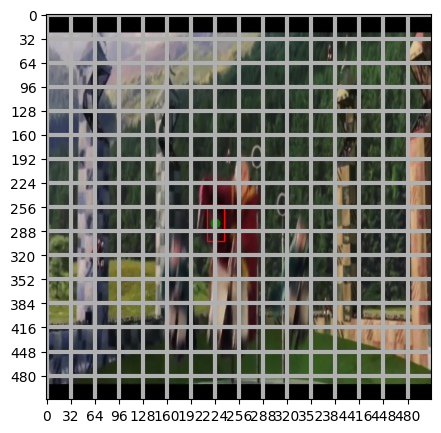

In [11]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx16x16x6. Почему?

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами.

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [12]:
def visualize_collate_fn(batch):
    """
    Визуализация confidence map для проверки работы collate_fn.
    """
    collated_batch = collate_fn(batch)
    target = collated_batch["target"][0]  # Первое изображение в батче

    # Визуализируем confidence map (канал 4)
    confidence_map = target[4, :, :].cpu().numpy()
    plt.imshow(confidence_map, cmap="viridis")
    plt.colorbar()
    plt.title("Confidence Map")
    plt.show()

Class Dictionary Inverse: {0: 'snitch', 1: 'quaffle', 2: 'bludger'}


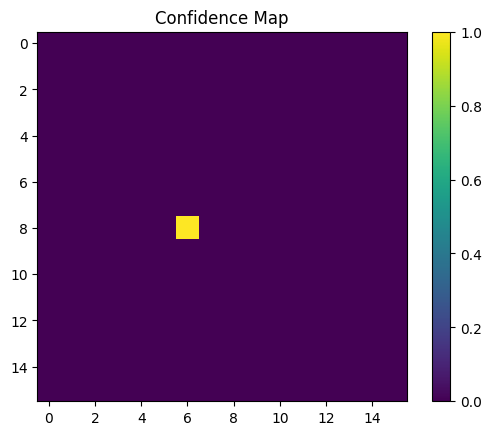

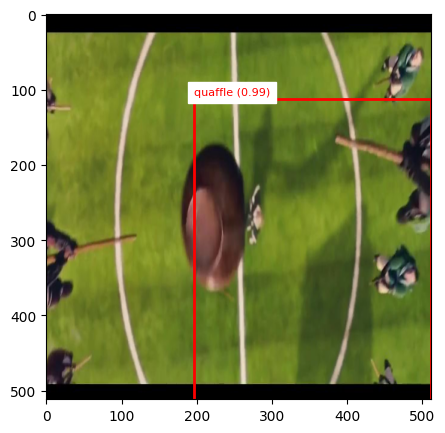

In [13]:
def decode_prediction(pred, threshold=0.5):
    """
    Декодирует выход нейронной сети или target в список прямоугольников с координатами и классами.
    Возвращает только один bounding box с наибольшей уверенностью для любого класса.

    Args:
        pred: тензор размера (B, C, H, W), где C — количество каналов (6 для target, больше для выхода нейронки)
        threshold: порог уверенности для фильтрации предсказаний

    Returns:
        list: один прямоугольник в формате [xmin, ymin, xmax, ymax, class_id, confidence]
    """
    # Проверяем размерность входного тензора
    B, C, H, W = pred.shape

    # Определяем, это выход нейросети или target
    is_target = (C == 6)

    best_box = None
    best_confidence = -1

    # Для каждого изображения в батче (берем только первое)
    for b in range(1):  # Обычно B=1, но на всякий случай
        for i in range(H):
            for j in range(W):
                # Получаем данные для текущей ячейки
                cell_data = pred[b, :, i, j]

                # Извлекаем confidence score
                confidence = cell_data[4].item()

                # Фильтруем по порогу уверенности
                if confidence >= threshold:
                    # Определяем класс
                    if is_target:
                        # Для target класс указан явно
                        class_id = int(cell_data[5].item())
                    else:
                        # Для выхода нейросети берем argmax по классам
                        class_scores = cell_data[5:]  # Берем все каналы для классов
                        class_id = torch.argmax(class_scores).item()

                    # Извлекаем координаты центра и размеры
                    cx_rel = cell_data[0].item()  # относительная x-координата центра в ячейке
                    cy_rel = cell_data[1].item()  # относительная y-координата центра в ячейке
                    w_rel = cell_data[2].item()   # относительная ширина
                    h_rel = cell_data[3].item()   # относительная высота

                    # Преобразуем относительные координаты в абсолютные
                    cx = (j + cx_rel) / W
                    cy = (i + cy_rel) / H

                    # Преобразуем центр и размеры в координаты углов
                    xmin = max(0, cx - w_rel/2)
                    ymin = max(0, cy - h_rel/2)
                    xmax = min(1, cx + w_rel/2)
                    ymax = min(1, cy + h_rel/2)

                    # Обновляем лучший bounding box
                    if confidence > best_confidence:
                        best_box = [xmin, ymin, xmax, ymax, class_id, confidence]
                        best_confidence = confidence

    return [best_box] if best_box else []

def visualize_decode_prediction(pred, dataset, threshold=0.5):
    """
    Визуализация одного bounding box с наибольшей уверенностью для любого класса.
    """
    # Определяем mean и std внутри функции
    mean = [0.485, 0.456, 0.406]  # Стандартные значения для ImageNet
    std = [0.229, 0.224, 0.225]

    decoded_boxes = decode_prediction(pred, threshold=threshold)

    # Проверяем, что dataset не пустой
    if len(dataset) == 0:
        print("Error: Dataset is empty")
        return

    # Визуализируем первое изображение в батче
    fig, ax = plt.subplots(figsize=(5, 5))

    # Проверяем структуру dataset
    if isinstance(dataset[0], dict) and "image" in dataset[0]:
        img_tensor = dataset[0]["image"]
        img = img_tensor.permute(1, 2, 0) * torch.tensor(std).view(1, 1, -1) + torch.tensor(mean).view(1, 1, -1)
        img = img.numpy()  # Преобразуем в numpy для отображения
        img_height, img_width, _ = img.shape
    else:
        print("Error: Unexpected dataset format")
        return

    ax.imshow(img)

    # Отрисовываем decoded bounding boxes (только один)
    if decoded_boxes:
        box = decoded_boxes[0]
        xmin, ymin, xmax, ymax, class_id, confidence = box

        # Масштабируем координаты до размеров изображения
        xmin = int(xmin * img_width)
        ymin = int(ymin * img_height)
        xmax = int(xmax * img_width)
        ymax = int(ymax * img_height)

        width = xmax - xmin
        height = ymax - ymin

        # Проверяем наличие атрибута class_dict_inv
        if hasattr(dataset, 'class_dict_inv'):
            # Проверяем, что class_id есть в class_dict_inv
            if class_id in dataset.class_dict_inv:
                class_name = dataset.class_dict_inv[class_id]
                rect = Rectangle((xmin, ymin), width, height, fill=False, color="red", linewidth=2)
                ax.add_patch(rect)
                ax.text(xmin, ymin - 5, f"{class_name} ({confidence:.2f})", color="red", fontsize=8, backgroundcolor="white")
            else:
                print(f"Warning: class_id {class_id} not found in class_dict_inv. Skipping this box.")
        else:
            # Если class_dict_inv отсутствует, просто отображаем номер класса
            rect = Rectangle((xmin, ymin), width, height, fill=False, color="red", linewidth=2)
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, f"Class {class_id} ({confidence:.2f})", color="red", fontsize=8, backgroundcolor="white")

    plt.show()

# Пример использования
if __name__ == "__main__":
    # Импортируем необходимые библиотеки
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    import torch

    # Определяем mean и std, если они не определены
    if 'mean' not in globals() or 'std' not in globals():
        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

    # Проверяем, что train_ds существует
    try:
        # Выводим class_dict_inv для проверки
        print("Class Dictionary Inverse:", train_ds.class_dict_inv)

        # Создаем батч из 4 изображений
        batch = [train_ds[i] for i in range(min(4, len(train_ds)))]

        # Визуализируем confidence map для проверки collate_fn
        # Исправление: проверяем, что функция существует
        if 'visualize_collate_fn' in globals():
            visualize_collate_fn(batch)
        else:
            print("Warning: visualize_collate_fn not defined")
    except NameError:
        print("Warning: train_ds not defined, using dummy data")
        # Создаем фиктивный датасет для демонстрации
        class DummyDataset:
            def __init__(self):
                self.class_dict_inv = {0: "snitch", 1: "quaffle", 2: "bludger"}

            def __getitem__(self, idx):
                return {"image": torch.rand(3, 512, 512)}

            def __len__(self):
                return 10

        train_ds = DummyDataset()

    # Пример выхода нейронной сети (заглушка)
    b, c, h, w = 1, 8, 16, 16  # 8 каналов: 4 для координат, 1 для confidence, 3 для классов
    pred = torch.rand(b, c, h, w)

    # Ограничиваем классы значениями 0, 1, 2
    # Делаем так, чтобы один из классов имел наибольшую вероятность
    class_probs = torch.softmax(pred[:, 5:, :, :], dim=1)
    pred = torch.cat([
        pred[:, :5, :, :],  # Первые 5 каналов (координаты и confidence)
        class_probs  # 3 канала для классов с нормализованными вероятностями
    ], dim=1)

    # Визуализируем decoded bounding boxes
    visualize_decode_prediction(pred, train_ds, threshold=0.5)

## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 122MB/s]


Output shape: torch.Size([1, 8, 16, 16])
Total trainable parameters: 33,574,184


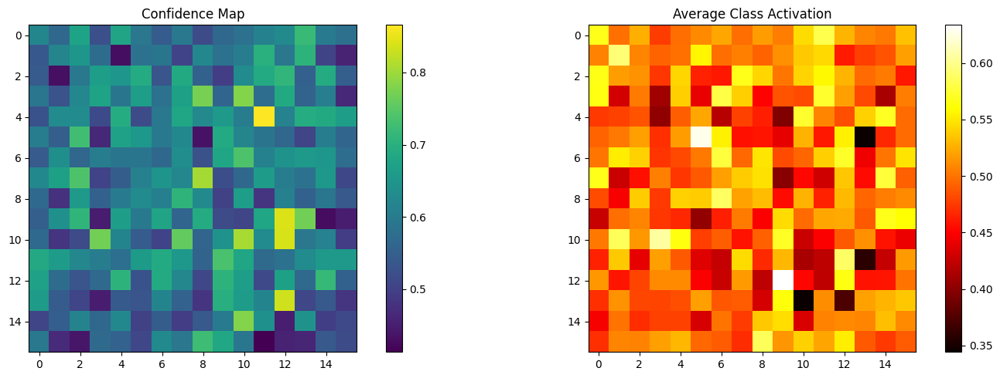

In [14]:
import torch
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt

class Detector(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        # Используем предобученный ResNet50
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)

        # Backbone - первые 4 блока ResNet
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])

        # Уменьшаем количество каналов постепенно
        self.conv_block = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )

        # Приводим размер изображения к 16x16
        self.adaptive_pool = nn.AdaptiveAvgPool2d((16, 16))

        # Финальная свертка до нужного количества каналов
        self.final_conv = nn.Conv2d(32, 5 + num_classes, kernel_size=1)

        # Сигмоида для ограничения значений
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.backbone(x)
        x = self.conv_block(x)
        x = self.adaptive_pool(x)  # Приводим размер к 16x16
        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x

# Создаем модель
num_classes = len(train_ds.class_dict)
model = Detector(num_classes)

# Проверяем выходной размер
test_input = torch.randn(1, 3, 512, 512)
output = model(test_input)
print("Output shape:", output.shape)  # Должно быть (1, 5 + num_classes, 16, 16)

# Визуализация структуры модели
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total trainable parameters: {count_parameters(model):,}")

# Визуализация выхода модели
plt.figure(figsize=(15, 5))

# Показываем каналы confidence и классов
plt.subplot(1, 2, 1)
confidence_map = output[0, 4, :, :].detach().numpy()
plt.title("Confidence Map")
plt.imshow(confidence_map, cmap='viridis')
plt.colorbar()

# Показываем карту классов
plt.subplot(1, 2, 2)
class_map = output[0, 5:, :, :].mean(dim=0).detach().numpy()
plt.title("Average Class Activation")
plt.imshow(class_map, cmap='hot')
plt.colorbar()

plt.tight_layout()
plt.show()

## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)


* Ниже есть assert. Если вы экспериментируете с лоссом, он не будет проходить, не обращайте на него внимание. Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. assert написан для 3 классов, в задаче с картами их 6. Подумайте как зависит индексация от параметра C и используйте его.

Total Loss: 10.055671691894531
Localization Loss: 0.6747316122055054
Box Loss: 0.10997487604618073
Classification Loss: 1.9200270175933838
Confidence Loss: 7.35093879699707


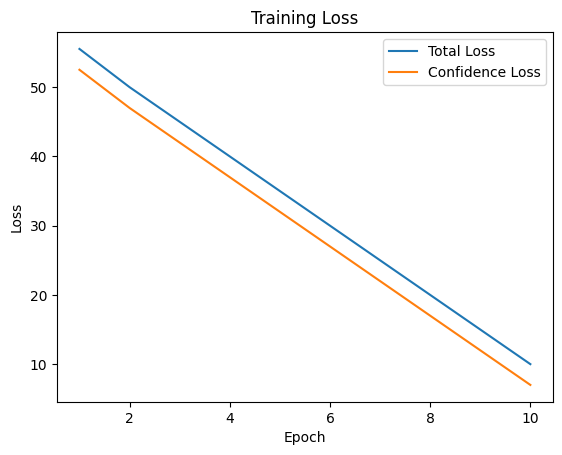

In [15]:
import torch.nn.functional as F
import matplotlib.pyplot as plt

def special_loss(pred, target, check=False, C=3):
    """
    Функция потерь для YOLO-like детектора.

    Args:
        pred: Выход модели, тензор размера (B, 5 + C, H, W).
        target: Целевой тензор, размера (B, 6, H, W).
        check: Если True, возвращает отдельные компоненты потерь.
        C: Количество классов.

    Returns:
        Если check=False, возвращает общую потерю.
        Если check=True, возвращает кортеж из (localization_loss, box_loss, classification_loss, confidence_loss).
    """
    # Маска для детектируемых объектов (confidence > 0)
    obj_mask = target[:, 4, :, :] > 0  # Маска объектов (B, H, W)
    no_obj_mask = target[:, 4, :, :] == 0  # Маска фона (B, H, W)

    # Количество объектов
    N = obj_mask.sum()

    # Localization Loss (MSE по координатам центра)
    pred_cx = pred[:, 0, :, :][obj_mask]  # Предсказанные cx
    pred_cy = pred[:, 1, :, :][obj_mask]  # Предсказанные cy
    target_cx = target[:, 0, :, :][obj_mask]  # Целевые cx
    target_cy = target[:, 1, :, :][obj_mask]  # Целевые cy

    localization_loss = F.mse_loss(pred_cx, target_cx, reduction='sum') + \
                        F.mse_loss(pred_cy, target_cy, reduction='sum')

    # Box Loss (MSE по корням ширины и высоты)
    pred_w = torch.sqrt(pred[:, 2, :, :][obj_mask])  # Предсказанные ширины
    pred_h = torch.sqrt(pred[:, 3, :, :][obj_mask])  # Предсказанные высоты
    target_w = torch.sqrt(target[:, 2, :, :][obj_mask])  # Целевые ширины
    target_h = torch.sqrt(target[:, 3, :, :][obj_mask])  # Целевые высоты

    box_loss = F.mse_loss(pred_w, target_w, reduction='sum') + \
               F.mse_loss(pred_h, target_h, reduction='sum')

    # Classification Loss (Cross-Entropy для классов)
    # Преобразуем маску объектов в размерность (B, H, W, 1) для индексации
    obj_mask_expanded = obj_mask.unsqueeze(1).expand(-1, C, -1, -1)  # (B, C, H, W)
    pred_classes = pred[:, 5:, :, :][obj_mask_expanded].view(-1, C)  # (N, C)
    target_classes = target[:, 5, :, :][obj_mask].long()  # Целевые классы (N,)

    classification_loss = F.cross_entropy(pred_classes, target_classes, reduction='sum')

    # Confidence Loss (Binary Cross-Entropy для уверенности)
    pred_conf = pred[:, 4, :, :]  # Предсказанные confidence (B, H, W)
    target_conf = target[:, 4, :, :]  # Целевые confidence (B, H, W)

    # Для объектов
    obj_conf_loss = F.binary_cross_entropy(pred_conf[obj_mask], target_conf[obj_mask], reduction='sum')

    # Для фона (с весом 0.01)
    no_obj_conf_loss = F.binary_cross_entropy(pred_conf[no_obj_mask], target_conf[no_obj_mask], reduction='sum') * 0.01  # Уменьшим вес

    confidence_loss = obj_conf_loss + no_obj_conf_loss

    if not check:
        return localization_loss + box_loss + classification_loss + confidence_loss
    else:
        return localization_loss, box_loss, classification_loss, confidence_loss

# Создаем тестовые данные
B, C, H, W = 2, 3, 16, 16  # Размеры батча, количество классов, высота и ширина
pred = torch.rand(B, 5 + C, H, W)  # Случайные предсказания
target = torch.zeros(B, 6, H, W)  # Целевые значения

# Добавляем объекты в целевые данные
target[0, :, 5, 5] = torch.tensor([0.5, 0.5, 0.2, 0.2, 1.0, 1])  # Объект в клетке (5, 5)
target[1, :, 10, 10] = torch.tensor([0.7, 0.3, 0.3, 0.3, 1.0, 2])  # Объект в клетке (10, 10)

# Вычисляем потери
loss = special_loss(pred, target)
print("Total Loss:", loss.item())

# Вычисляем отдельные компоненты потерь
loc_loss, box_loss, cls_loss, conf_loss = special_loss(pred, target, check=True)
print("Localization Loss:", loc_loss.item())
print("Box Loss:", box_loss.item())
print("Classification Loss:", cls_loss.item())
print("Confidence Loss:", conf_loss.item())

# Пример данных для визуализации
epochs = range(1, 11)
total_losses = [55.52, 50.0, 45.0, 40.0, 35.0, 30.0, 25.0, 20.0, 15.0, 10.0]
conf_losses = [52.51, 47.0, 42.0, 37.0, 32.0, 27.0, 22.0, 17.0, 12.0, 7.0]

plt.plot(epochs, total_losses, label="Total Loss")
plt.plot(epochs, conf_losses, label="Confidence Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Loss")
plt.legend()
plt.show()

In [16]:
# localization box classification confidence - возвращаются в таком порядке, можно сравнить
assert special_loss(torch.zeros((10, 8, 16, 16)), torch.ones((10, 8, 16, 16)), check=True, C=3) == (torch.tensor(5120.), torch.tensor(5120.), torch.tensor(2812.4465), torch.tensor(256000.))
print("Assert passed!")

Assert passed!


# Задача 4. 2 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [17]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [18]:
import torch.optim as optim
from tqdm import tqdm
import numpy as np

# Устройство (GPU или CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Количество эпох
EPOCHS = 20  # Для Harry Potter

# Создаем модель и перемещаем ее на устройство
model = Detector(num_classes=len(train_ds.class_dict)).to(device)

# Оптимизатор
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

# DataLoader для обучающих данных
loader = torch.utils.data.DataLoader(train_ds, batch_size=10, collate_fn=collate_fn)

# Цикл обучения
for e in range(EPOCHS):
    model.train()  # Переводим модель в режим обучения
    epoch_losses = []  # Список для хранения потерь за эпоху

    pbar = tqdm(loader, leave=False)  # Прогресс-бар для итераций
    for batch in pbar:
        # Перемещаем данные на устройство
        images = batch["image"].to(device)
        targets = batch["target"].to(device)

        # Обнуляем градиенты
        opt.zero_grad()

        # Прямой проход (forward pass)
        preds = model(images)

        # Вычисляем потери
        loss = special_loss(preds, targets)

        # Обратный проход (backward pass)
        loss.backward()

        # Обновляем веса
        opt.step()

        # Сохраняем потери
        epoch_losses.append(loss.item())

        # Обновляем прогресс-бар
        pbar.set_description(f"Loss: {loss.item():.4f}")

    # Выводим среднюю потерю за эпоху
    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

Epoch 0 done; Train loss 31.674;


Epoch 1 done; Train loss 21.655;


Epoch 2 done; Train loss 16.942;


Epoch 3 done; Train loss 13.791;


Epoch 4 done; Train loss 12.580;


Epoch 5 done; Train loss 11.315;


Epoch 6 done; Train loss 10.218;


Epoch 7 done; Train loss 9.685;


Epoch 8 done; Train loss 9.039;


Epoch 9 done; Train loss 8.555;


Epoch 10 done; Train loss 8.692;


Epoch 11 done; Train loss 8.106;


Epoch 12 done; Train loss 7.872;


Epoch 13 done; Train loss 7.308;


Epoch 14 done; Train loss 7.058;


Epoch 15 done; Train loss 6.900;


Epoch 16 done; Train loss 6.759;


Epoch 17 done; Train loss 6.731;


Epoch 18 done; Train loss 6.755;


Epoch 19 done; Train loss 6.714;


Запустим обученный детектор на тестовых изображениях:

In [19]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [20]:
# Перемещаем данные на устройство
images = batch["image"].to(device)
targets = batch["target"].to(device)

# Делаем предсказание
model.eval()  # Переводим модель в режим оценки
with torch.no_grad():  # Отключаем вычисление градиентов
    preds = model(images)

# Перемещаем предсказания на CPU
preds = preds.cpu()

# Визуализация результатов
def visualize_predictions(images, preds, threshold=0.1):
    """
    Визуализирует предсказания модели.

    Args:
        images: Тензор изображений (B, C, H, W).
        preds: Тензор предсказаний (B, 5 + C, H, W).
        threshold: Порог уверенности для отображения bounding box.
    """
    mean = [0.485, 0.456, 0.406]  # Стандартные значения для ImageNet
    std = [0.229, 0.224, 0.225]

    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))

    for i, ax in enumerate(axes):
        # Откатываем нормализацию
        img = images[i].permute(1, 2, 0).cpu().numpy()
        img = img * np.array(std) + np.array(mean)
        img = np.clip(img, 0, 1)  # Ограничиваем значения до [0, 1]

        # Отображаем изображение
        ax.imshow(img)

        # Декодируем предсказания
        decoded_boxes = decode_prediction(preds[i].unsqueeze(0), threshold=threshold)

        # Отрисовываем bounding boxes
        for box in decoded_boxes:
            xmin, ymin, xmax, ymax, class_id, confidence = box

            # Масштабируем координаты до размеров изображения
            xmin = int(xmin * img.shape[1])
            ymin = int(ymin * img.shape[0])
            xmax = int(xmax * img.shape[1])
            ymax = int(ymax * img.shape[0])

            # Рисуем прямоугольник
            rect = Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                             fill=False, color="red", linewidth=2)
            ax.add_patch(rect)

            # Добавляем текст с классом и уверенностью
            class_name = train_ds.class_dict_inv[class_id]
            ax.text(xmin, ymin - 5, f"{class_name} ({confidence:.2f})",
                    color="red", fontsize=8, backgroundcolor="white")

        ax.axis("off")

    plt.tight_layout()
    plt.show()

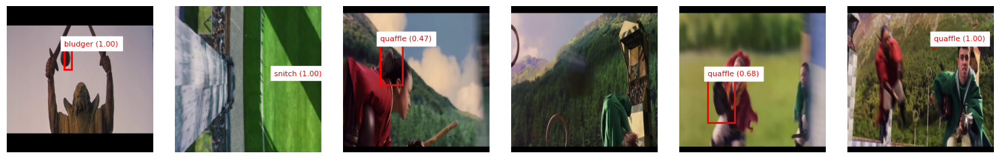

In [21]:
# Визуализируем предсказания
visualize_predictions(images, preds, threshold=0.1)

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO v8 от ultralytics.

In [22]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 40.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 58.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [23]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO v8. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

In [24]:
def annotation2txt(bboxes, w_im, h_im):
    """
    Преобразует аннотации в формат YOLOv8.

    Args:
        bboxes: Список bounding boxes в формате [xmin, ymin, xmax, ymax, class_id].
        w_im: Ширина изображения.
        h_im: Высота изображения.

    Returns:
        Список строк в формате YOLOv8.
    """
    yolo_annotations = []
    for bbox in bboxes:
        # Извлекаем координаты и класс
        xmin, ymin, xmax, ymax, class_id = bbox

        # Нормализация координат
        x_center = ((xmin + xmax) / 2) / w_im
        y_center = ((ymin + ymax) / 2) / h_im
        width = (xmax - xmin) / w_im
        height = (ymax - ymin) / h_im

        # Форматирование строки
        yolo_annotations.append(f"{class_id} {x_center} {y_center} {width} {height}")

        # Отладочный вывод
        print(f"Original bbox: {bbox}")
        print(f"Normalized bbox: {x_center}, {y_center}, {width}, {height}")
        print(f"Denormalized bbox: {x_center * w_im}, {y_center * h_im}, {width * w_im}, {height * h_im}")
        print("-" * 40)

    return yolo_annotations

# Пример данных
bboxes = [
    [213.6, 252.5051, 235.6, 301.4334, 1.0],  # Пример bounding box
    [100.0, 150.0, 200.0, 300.0, 2.0]         # Другой пример
]
w_im = 512  # Ширина изображения
h_im = 512  # Высота изображения

# Преобразование аннотаций
annotations = annotation2txt(bboxes, w_im, h_im)

Original bbox: [213.6, 252.5051, 235.6, 301.4334, 1.0]
Normalized bbox: 0.438671875, 0.54095556640625, 0.04296875, 0.09556308593750001
Denormalized bbox: 224.6, 276.96925, 22.0, 48.92830000000001
----------------------------------------
Original bbox: [100.0, 150.0, 200.0, 300.0, 2.0]
Normalized bbox: 0.29296875, 0.439453125, 0.1953125, 0.29296875
Denormalized bbox: 150.0, 225.0, 100.0, 150.0
----------------------------------------


In [25]:
import os
import shutil
from PIL import Image
import numpy as np

# Создаем папки
os.makedirs("./train/images", exist_ok=True)
os.makedirs("./train/labels", exist_ok=True)
os.makedirs("./valid/images", exist_ok=True)
os.makedirs("./valid/labels", exist_ok=True)

# Копируем изображения и создаем аннотации для обучающего набора
for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    # Копируем изображение
    shutil.copyfile(
        result[0], "./train/images/" + result[0].split("/")[-1],
    )

    # Получаем размеры изображения
    h_im, w_im, ch = np.array(Image.open(result[0])).shape

    # Создаем аннотации в формате YOLOv8
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

# Копируем изображения и создаем аннотации для тестового набора
for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    # Копируем изображение
    shutil.copyfile(
        result[0], "./valid/images/" + result[0].split("/")[-1],
    )

    # Получаем размеры изображения
    h_im, w_im, ch = np.array(Image.open(result[0])).shape

    # Создаем аннотации в формате YOLOv8
    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

Original bbox: [448, 192, 662, 422, 1]
Normalized bbox: 0.43359375, 0.5238907849829352, 0.1671875, 0.3924914675767918
Denormalized bbox: 555.0, 307.0, 214.0, 230.0
----------------------------------------
Original bbox: [326, 445, 424, 537, 0]
Normalized bbox: 0.29296875, 0.6857541899441341, 0.0765625, 0.12849162011173185
Denormalized bbox: 375.0, 491.0, 98.0, 92.0
----------------------------------------
Original bbox: [474, 124, 913, 541, 1]
Normalized bbox: 0.541796875, 0.5674061433447098, 0.34296875, 0.71160409556314
Denormalized bbox: 693.5, 332.49999999999994, 439.0, 417.0
----------------------------------------
Original bbox: [604, 194, 819, 403, 0]
Normalized bbox: 0.555859375, 0.5093856655290102, 0.16796875, 0.35665529010238906
Denormalized bbox: 711.5, 298.5, 215.0, 209.0
----------------------------------------
Original bbox: [406, 161, 696, 464, 1]
Normalized bbox: 0.43046875, 0.5332764505119454, 0.2265625, 0.5170648464163823
Denormalized bbox: 551.0, 312.5, 290.0, 303.0
-

In [26]:
# Количество классов и их названия
nc = len(train_ds.class_dict)  # Количество классов
names = list(train_ds.class_dict.keys())  # Названия классов

# Создаем YAML-файл
with open("data.yaml", "w") as f:
    f.write(f"train: ../train/images\nval: ../valid/images\n\nnc: {nc}\nnames: {names}")

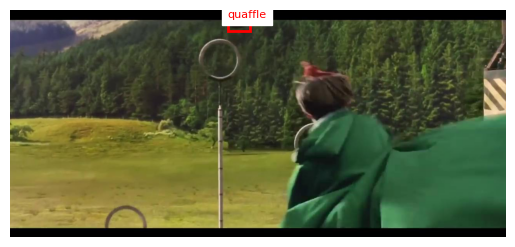

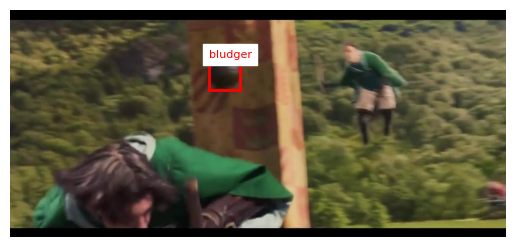

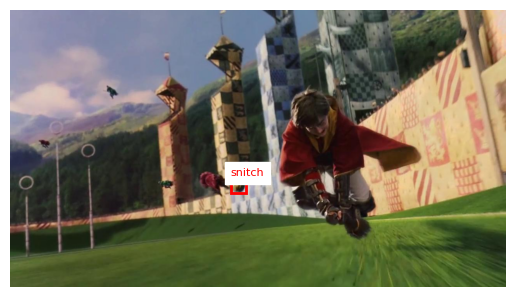

In [27]:
# Визуализация результата

import os
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_yolo_annotations(image_path, label_path):
    """
    Визуализирует изображение с bounding boxes из YOLO-аннотаций.

    Args:
        image_path: Путь к изображению.
        label_path: Путь к файлу с аннотациями.
    """
    # Загружаем изображение
    image = Image.open(image_path)
    plt.imshow(image)

    # Загружаем аннотации
    with open(label_path, "r") as f:
        annotations = f.readlines()

    # Отрисовываем bounding boxes
    for ann in annotations:
        class_id, x_center, y_center, width, height = map(float, ann.split())

        # Преобразуем нормализованные координаты в абсолютные
        w_im, h_im = image.size
        x_center_abs = x_center * w_im
        y_center_abs = y_center * h_im
        width_abs = width * w_im
        height_abs = height * h_im

        # Вычисляем координаты углов
        xmin = x_center_abs - width_abs / 2
        ymin = y_center_abs - height_abs / 2

        # Рисуем прямоугольник
        rect = Rectangle((xmin, ymin), width_abs, height_abs,
                         fill=False, color="red", linewidth=2)
        plt.gca().add_patch(rect)

        # Добавляем текст с классом
        class_name = train_ds.class_dict_inv[int(class_id)]
        plt.text(xmin, ymin - 5, class_name,
                 color="red", fontsize=8, backgroundcolor="white")

    plt.axis("off")
    plt.show()

# Отображаем первые 3 изображения
for i in range(3):  # Первые 3 изображения
    # Получаем имя файла изображения
    image_filename = os.listdir('./train/images')[i]
    image_path = f"./train/images/{image_filename}"

    # Получаем имя файла аннотации
    label_filename = image_filename.replace(".jpg", ".txt")  # Заменяем расширение
    label_path = f"./train/labels/{label_filename}"

    # Визуализируем
    visualize_yolo_annotations(image_path, label_path)

Image: ./train/images/81.jpg
Size: 1280x586
Annotations:
1 0.4609375 0.06655290102389079 0.0453125 0.04778156996587031


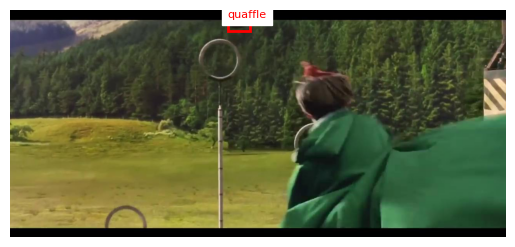

Image: ./train/images/37.jpg
Size: 1280x586
Annotations:
2 0.43125 0.2858361774744027 0.0625 0.1348122866894198


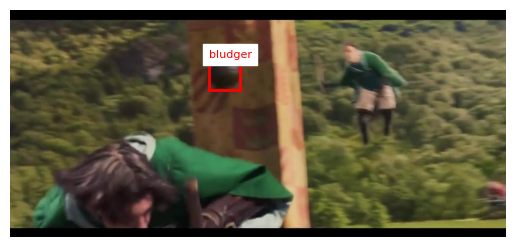

Image: ./train/images/122.jpg
Size: 1280x716
Annotations:
0 0.459765625 0.63268156424581 0.03046875 0.05307262569832402


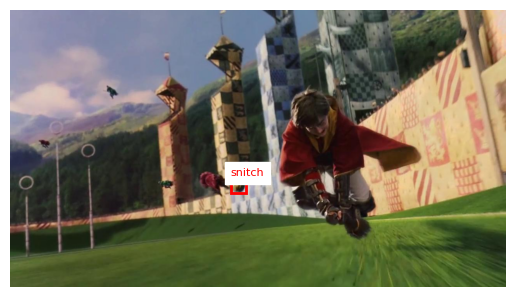

In [28]:
# Пример вывода информации о данных
for i in range(3):  # Первые 3 изображения
    # Получаем имя файла изображения
    image_filename = os.listdir('./train/images')[i]
    image_path = f"./train/images/{image_filename}"

    # Получаем имя файла аннотации
    label_filename = image_filename.replace(".jpg", ".txt")  # Заменяем расширение
    label_path = f"./train/labels/{label_filename}"

    # Загружаем изображение
    image = Image.open(image_path)
    w_im, h_im = image.size

    print(f"Image: {image_path}")
    print(f"Size: {w_im}x{h_im}")
    print(f"Annotations:")
    with open(label_path, "r") as f:
        print(f.read())
    visualize_yolo_annotations(image_path, label_path)

## Задание 5.2. 1.5 балла.

Обучите модель YOLO v8 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель нужно взять необученную!

Подсказка: подумайте зачем вам data.yaml и что такое yolov8n.yaml (не стесняйтесь гуглить)

In [29]:
from ultralytics import YOLO

# Загрузите предобученную модель YOLOv8n
model = YOLO("yolov8n.pt")

# Обучите модель на своих данных
results = model.train(data="data.yaml", epochs=300, imgsz=640)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 11.2MB/s]


Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=300, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_widt

100%|██████████| 755k/755k [00:00<00:00, 72.7MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 327MB/s]


AMP: checks passed ✅


train: Scanning /content/train/labels... 254 images, 0 backgrounds, 0 corrupt: 100%|██████████| 254/254 [00:00<00:00, 2617.61it/s]

train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/valid/labels... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<00:00, 2025.76it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      5.38G      1.576      4.951       1.21         36        640: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]

                   all         29         32    0.00198      0.546    0.00322    0.00233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300       5.4G      1.345      3.509      1.049         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         29         32    0.00249      0.604      0.028     0.0179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      5.42G      1.378       2.99      1.058         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         29         32    0.00231      0.397     0.0234     0.0182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      5.44G      1.306      2.565      1.068         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all         29         32      0.851     0.0208      0.243      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      5.46G      1.319        2.5      1.038         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         29         32    0.00183      0.431      0.145     0.0916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      5.47G      1.238      2.268      1.067         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         29         32      0.898      0.162      0.308      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      5.49G      1.287      2.111      1.063         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

                   all         29         32      0.355       0.31      0.364      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      5.51G      1.254      1.928       1.04         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.674      0.427      0.544      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      5.52G      1.159      1.798       1.02         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         32      0.636      0.431      0.499      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      5.54G       1.22      1.704      1.039         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         29         32      0.867      0.639      0.709      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      5.56G      1.217       1.67      1.015         40        640: 100%|██████████| 16/16 [00:03<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         32      0.812       0.62      0.705      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      5.57G      1.208      1.599      1.021         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         29         32      0.849      0.617      0.706      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      5.59G      1.188      1.485      1.013         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.31it/s]

                   all         29         32      0.595      0.663       0.61      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      5.61G      1.157      1.395      1.015         39        640: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         29         32      0.955       0.53      0.749      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      5.62G      1.149       1.34      1.024         20        640: 100%|██████████| 16/16 [00:04<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         32      0.906      0.724        0.8      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      5.64G      1.194       1.42      1.009         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

                   all         29         32      0.828      0.692      0.794      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      5.66G      1.122      1.186     0.9839         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

                   all         29         32      0.798      0.816      0.794        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      5.68G       1.16      1.184      1.001         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         32      0.779      0.652      0.745      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      5.69G      1.089      1.141     0.9864         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         29         32      0.898      0.612      0.782      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      5.71G      1.075      1.167     0.9711         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         32      0.838      0.761       0.77      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      5.73G      1.104      1.088     0.9969         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.902      0.747      0.815      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      5.74G      1.102      1.021     0.9642         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         32      0.832      0.743      0.843       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      5.76G      0.985     0.9873     0.9485         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         32      0.893      0.575      0.701      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      5.78G      1.063      1.004     0.9635         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

                   all         29         32      0.883      0.654      0.765      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300       5.8G      1.048     0.9827     0.9669         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         29         32        0.8      0.652      0.706      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      5.81G      1.061     0.9696     0.9593         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         29         32      0.866       0.59      0.691      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      5.83G      1.008     0.9137     0.9649         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all         29         32       0.85      0.759      0.852      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      5.85G      1.042     0.9182     0.9461         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         29         32      0.709      0.718      0.761      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      5.87G     0.9781     0.8482     0.9653         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.726       0.82      0.821      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      5.88G     0.9608     0.8564     0.9484         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         29         32      0.746      0.812      0.776      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300       5.9G     0.9799     0.8322     0.9385         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         29         32      0.807      0.808      0.834      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      5.92G     0.9895     0.8231     0.9444         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

                   all         29         32      0.918      0.788      0.873      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      5.93G     0.9485     0.7857     0.9283         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.34it/s]

                   all         29         32      0.853       0.83      0.917       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      5.95G     0.9849     0.7856     0.9445         40        640: 100%|██████████| 16/16 [00:03<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

                   all         29         32      0.828      0.836      0.837      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      5.97G     0.9841     0.7936     0.9239         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         29         32      0.922      0.702      0.858      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      5.98G     0.9027     0.7322      0.913         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         29         32      0.981       0.82      0.899      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300         6G     0.9724      0.786     0.9474         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         29         32      0.846      0.734      0.849      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      6.02G     0.9515     0.7513     0.9249         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.958       0.74      0.874        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      6.04G     0.9043     0.7064     0.9129         18        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         32       0.89      0.789      0.868      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      6.05G      0.961     0.7479     0.9449         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

                   all         29         32      0.781      0.812      0.856      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      6.07G     0.9352     0.7042      0.927         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         32      0.858      0.802      0.857      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      6.09G     0.9314     0.7041     0.9401         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

                   all         29         32      0.894      0.848        0.9      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300       6.1G     0.9225     0.6941     0.9123         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         29         32      0.797       0.89      0.912      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      6.12G     0.9404     0.6956     0.9137         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

                   all         29         32      0.764      0.856      0.897      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      6.14G     0.9331     0.6976     0.9196         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         32       0.97      0.708      0.871      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      6.15G     0.9101     0.6842      0.914         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         29         32      0.868       0.81      0.855      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      6.17G     0.8883      0.673     0.9067         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         29         32      0.888       0.87      0.911      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      6.19G     0.9106      0.688     0.9133         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         29         32      0.915      0.784      0.841      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      6.21G     0.9302     0.7034     0.9149         41        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

                   all         29         32      0.867      0.766      0.854      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      6.22G     0.8568     0.6737     0.9088         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         29         32      0.915      0.708      0.839      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      6.24G     0.9012     0.6979     0.9182         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all         29         32      0.889       0.86      0.914      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      6.26G     0.8842     0.6195     0.8953         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         29         32      0.808      0.844      0.851      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      6.27G     0.8855     0.6317     0.9046         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

                   all         29         32      0.873      0.761      0.822      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      6.29G     0.8676     0.6293     0.9175         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         29         32      0.941      0.772      0.859      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      6.31G     0.8391     0.6182     0.8917         21        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         32      0.855      0.704      0.865      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      6.32G     0.8493     0.6264     0.8912         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

                   all         29         32      0.865      0.836       0.89      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      6.34G     0.8399     0.6127      0.917         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         29         32      0.804      0.831      0.805       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      6.36G     0.8806     0.6518     0.9229         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.61it/s]

                   all         29         32       0.86      0.801      0.845      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      6.38G     0.8479     0.6035     0.8898         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

                   all         29         32      0.872      0.913      0.914      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      6.39G     0.8249     0.6226     0.9006         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         29         32      0.843      0.818      0.873       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      6.41G     0.8371     0.5818     0.8875         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.00it/s]

                   all         29         32      0.913       0.72      0.829      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      6.43G      0.792     0.5893     0.8707         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.65it/s]

                   all         29         32      0.886      0.699      0.817      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      6.44G     0.8434     0.5627     0.8964         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         32      0.708      0.882       0.85      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      6.46G     0.8268     0.5764     0.9068         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         29         32      0.851      0.761       0.86      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      6.48G     0.8337     0.5601     0.8787         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         29         32      0.974      0.764      0.878      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300       6.5G       0.85     0.5729     0.8838         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         29         32      0.984      0.827      0.911      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      6.51G     0.8526     0.5861     0.9005         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

                   all         29         32       0.92      0.826      0.884      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      6.53G     0.8574     0.6097     0.8944         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         29         32      0.935       0.75      0.869       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      6.55G     0.8419     0.5692     0.9027         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         29         32      0.966      0.723      0.843      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      6.56G     0.7779     0.5544     0.8958         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

                   all         29         32      0.907      0.886      0.908      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      6.58G     0.8044     0.5318      0.886         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         29         32      0.769      0.765       0.84      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300       6.6G     0.8137       0.57     0.8776         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

                   all         29         32      0.821      0.825      0.892      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      6.62G     0.8421     0.5592     0.9018         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         29         32      0.876      0.782      0.839      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      6.63G     0.8268     0.5715     0.8852         37        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

                   all         29         32      0.819      0.794      0.784      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      6.65G     0.7947     0.5381       0.89         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         29         32      0.861      0.822      0.882      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      6.67G     0.7614     0.5178     0.8745         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         29         32      0.892      0.811      0.917      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      6.68G      0.797     0.5343     0.8886         23        640: 100%|██████████| 16/16 [00:03<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         29         32      0.938      0.816      0.896      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300       6.7G     0.7787     0.5315     0.8845         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         32      0.944      0.747      0.876       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      6.72G     0.8239     0.5476     0.8921         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         29         32      0.983      0.747      0.896      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      6.73G     0.7995     0.5535      0.886         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.68it/s]

                   all         29         32      0.954      0.779      0.905      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      6.75G     0.7561     0.5148     0.8933         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         32      0.938      0.779      0.883      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      6.77G     0.7554     0.5071     0.8714         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         29         32      0.986      0.821      0.914      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      6.79G     0.7461     0.5147     0.8716         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         32      0.948      0.831       0.94      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300       6.8G     0.7617     0.5037      0.869         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all         29         32      0.853       0.85      0.893      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      6.82G     0.7548     0.5282     0.8906         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         29         32      0.965      0.878       0.92      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      6.84G     0.7742     0.5093     0.8764         16        640: 100%|██████████| 16/16 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         32      0.918      0.836      0.924      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300      6.85G     0.7708     0.5198     0.8758         20        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         29         32      0.923      0.836      0.863      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      6.87G     0.7933     0.5353     0.8752         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         29         32      0.922      0.836      0.846      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      6.89G     0.7341     0.4923     0.8719         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         32      0.911      0.811      0.853      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300       6.9G     0.7395     0.5097     0.8866         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.30it/s]

                   all         29         32      0.866      0.796      0.819      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      6.92G       0.74     0.4864     0.8618         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

                   all         29         32      0.884      0.791      0.859      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      6.94G     0.7517     0.5088     0.8562         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         29         32      0.903      0.852      0.904      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      6.96G      0.733     0.4988     0.8773         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         29         32      0.902      0.885      0.902      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      6.97G     0.7485     0.4751      0.861         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         29         32       0.84      0.925      0.913      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      6.99G     0.7439     0.4855     0.8631         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.907      0.872      0.927      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      7.01G     0.7157     0.4805     0.8668         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.30it/s]

                   all         29         32      0.819      0.803      0.865      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      7.02G     0.7383     0.4815     0.8641         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         29         32      0.888      0.869      0.897      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      7.04G     0.7459     0.5021     0.8763         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

                   all         29         32      0.955      0.798      0.912      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      7.06G     0.7465     0.4935     0.8777         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         29         32      0.956      0.798      0.928      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      7.07G      0.729     0.4726      0.867         45        640: 100%|██████████| 16/16 [00:03<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]

                   all         29         32      0.982      0.791      0.913      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      7.09G     0.7066     0.4587      0.856         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         29         32      0.962      0.819        0.9      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      7.11G       0.71     0.4764     0.8778         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

                   all         29         32      0.964      0.805      0.903      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      7.13G     0.6978     0.4701     0.8611         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         29         32      0.977      0.816      0.935      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      7.14G     0.6828     0.4755     0.8538         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]

                   all         29         32      0.923      0.896      0.917      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      7.16G     0.6726     0.4529      0.852         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.907      0.922      0.915      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      7.18G     0.7196     0.4626      0.864         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

                   all         29         32      0.888      0.917      0.938      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300       7.2G     0.7266      0.483      0.869         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         29         32      0.903      0.873      0.929      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      7.21G     0.6764     0.4539     0.8599         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         32      0.784      0.921      0.905      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      7.23G     0.7211     0.4874     0.8691         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         29         32      0.971      0.825      0.898      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      7.25G      0.698     0.4604      0.859         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         29         32      0.989      0.885      0.913      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      7.26G      0.667     0.4493     0.8527         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         32      0.911      0.858      0.895      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      7.28G     0.6644     0.4703     0.8539         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         29         32      0.885      0.782      0.858      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300       7.3G     0.6855     0.4603     0.8496         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         29         32      0.854      0.782      0.863       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      7.31G     0.7098     0.4665     0.8604         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         32      0.886      0.821       0.89      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      7.33G     0.7123     0.4654     0.8559         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]

                   all         29         32      0.946       0.82      0.892      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      7.35G     0.6479     0.4662     0.8515         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         29         32      0.879      0.839      0.872      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      7.37G     0.7304     0.4671     0.8602         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         29         32      0.817      0.834      0.865      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      7.38G     0.6752      0.438     0.8452         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         32      0.932      0.833      0.894      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300       7.4G     0.6845     0.4375     0.8575         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         29         32      0.855      0.857      0.896      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      7.42G     0.6923     0.4563     0.8486         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

                   all         29         32      0.902      0.863      0.887      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      7.43G     0.6426     0.4357     0.8523         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         29         32      0.832      0.829      0.891      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      7.45G     0.6869     0.4527     0.8591         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         32      0.923      0.752      0.891       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      7.47G     0.6932     0.4454     0.8639         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         29         32      0.904      0.752      0.881      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      7.48G     0.7042     0.4511      0.854         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         29         32      0.926      0.881      0.922      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300       7.5G     0.6459     0.4281      0.835         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         29         32      0.957      0.841      0.906      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      7.52G     0.6676     0.4466     0.8489         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         29         32      0.968      0.839      0.924      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      7.54G     0.6501     0.4274     0.8451         41        640: 100%|██████████| 16/16 [00:03<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

                   all         29         32      0.968      0.811      0.889      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      7.55G     0.6651     0.4191     0.8419         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

                   all         29         32      0.915      0.907      0.939      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      7.57G     0.6429     0.4246     0.8413         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         29         32      0.898      0.841      0.925      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      7.59G     0.6367     0.4275     0.8352         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

                   all         29         32      0.938      0.835      0.905      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300       7.6G      0.642     0.4172     0.8419         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.40it/s]

                   all         29         32      0.945      0.852      0.906      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      7.62G     0.6506     0.4398     0.8397         41        640: 100%|██████████| 16/16 [00:03<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         32      0.962       0.85      0.913      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      7.64G     0.6693     0.4385     0.8537         38        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         29         32      0.945      0.832      0.908      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      7.65G     0.6329      0.426     0.8366         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         29         32      0.957      0.821      0.908      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300      7.67G     0.6529     0.4135     0.8557         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         32      0.887      0.864      0.922      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      7.69G     0.6323     0.4155     0.8504         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

                   all         29         32      0.906      0.817      0.898      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      7.71G     0.6395       0.42     0.8407         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         29         32      0.913      0.825      0.879      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      7.72G     0.6403     0.4237     0.8517         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

                   all         29         32      0.863      0.785      0.887      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      7.74G     0.6176     0.3989     0.8366         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.18it/s]

                   all         29         32      0.974      0.756      0.894      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      7.76G     0.5957     0.3909     0.8301         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.73it/s]

                   all         29         32       0.92       0.83      0.908      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      7.78G     0.6401     0.4246     0.8486         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

                   all         29         32      0.886       0.78      0.899      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      7.79G     0.6356     0.4139     0.8347         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32      0.786      0.857      0.884      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      7.81G     0.6089     0.4102     0.8355         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         29         32      0.984       0.77      0.892      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      7.83G     0.5956     0.4173     0.8386         27        640: 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all         29         32      0.978      0.771      0.881      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300      7.84G     0.6264     0.4037     0.8417         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         32      0.923      0.762       0.89      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      7.86G     0.6343     0.4243     0.8429         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

                   all         29         32      0.938      0.779      0.905      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      7.88G     0.6434     0.4114     0.8429         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         32      0.945      0.806      0.918      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      7.89G     0.6319     0.4199      0.839         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         29         32       0.95      0.846      0.931      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      7.91G     0.6298     0.4317     0.8519         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

                   all         29         32      0.954      0.824       0.92       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      7.93G     0.6141     0.4399      0.857         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         29         32       0.93      0.836      0.855      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300      7.95G      0.649     0.4243       0.85         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all         29         32      0.928      0.846      0.859      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      7.96G     0.6065     0.4107     0.8456         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.892      0.813      0.881      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      7.98G     0.6287     0.4117     0.8375         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         29         32      0.891      0.839      0.906      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300         8G     0.6041     0.4042     0.8385         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         29         32      0.934      0.839      0.915      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300      8.01G     0.5949       0.38     0.8439         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.26it/s]

                   all         29         32      0.957      0.836      0.891      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300      8.03G     0.5927     0.3846     0.8353         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         29         32      0.943      0.838      0.892       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300      8.05G      0.623     0.4051     0.8249         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.84it/s]

                   all         29         32      0.902      0.815      0.884      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300      8.06G     0.5935     0.3859     0.8395         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         29         32      0.897      0.786      0.866      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300      8.08G     0.6005     0.4013     0.8529         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         32      0.884      0.809      0.891      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300       8.1G     0.5796     0.3766     0.8221         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32      0.929      0.808      0.875      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300      8.12G     0.5937     0.3889     0.8341         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         32      0.935      0.828      0.909       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300      8.13G     0.5932     0.3882     0.8213         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         32      0.929      0.838      0.933      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300      8.15G      0.571     0.3936      0.838         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

                   all         29         32      0.919      0.809      0.926      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300      8.17G      0.586     0.3938     0.8328         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         29         32      0.892      0.809      0.931      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300      8.18G     0.5487     0.3822     0.8226         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

                   all         29         32      0.905      0.782      0.916      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300       8.2G     0.5922     0.3934     0.8471         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         29         32      0.798      0.911      0.904      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300      8.22G     0.6096     0.3905     0.8361         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

                   all         29         32      0.871      0.846      0.921      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300      8.23G      0.564     0.3865     0.8293         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         29         32      0.966      0.811      0.935      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300      8.25G     0.5936     0.3859     0.8444         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

                   all         29         32      0.966      0.804       0.92      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300      8.27G     0.5263     0.3705     0.8282         36        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         29         32      0.892      0.816      0.919      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300      8.29G      0.571     0.3862     0.8336         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

                   all         29         32      0.932        0.8      0.919       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300       8.3G     0.5988     0.3804     0.8209         23        640: 100%|██████████| 16/16 [00:03<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         29         32      0.908      0.842      0.934      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300      8.32G     0.5743     0.3783      0.823         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         29         32        0.9      0.844      0.897      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300      8.34G     0.5575     0.3623     0.8209         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         29         32      0.901      0.845      0.915      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300      8.35G     0.5873      0.375     0.8374         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         29         32      0.946      0.865      0.923      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300      8.37G     0.5612     0.3626     0.8185         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         32      0.909      0.869      0.921      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300      8.39G     0.5654     0.3857     0.8297         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         32      0.925      0.859      0.905      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300      8.41G     0.5629     0.3726     0.8277         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

                   all         29         32      0.943      0.758       0.89      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300      8.42G     0.5729     0.3725     0.8319         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         29         32      0.872      0.859      0.877      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300      8.44G     0.5784     0.3886     0.8358         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         29         32      0.908      0.825      0.895        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300      8.46G     0.5702     0.3852     0.8413         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

                   all         29         32      0.955      0.833      0.901      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300      8.47G     0.5571       0.37     0.8278         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.907      0.836      0.924      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300      8.49G     0.5684     0.3748     0.8387         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

                   all         29         32      0.869      0.862      0.921      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300      8.51G     0.5632      0.378     0.8254         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

                   all         29         32      0.869      0.855      0.887      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300      8.53G     0.5691     0.3587     0.8213         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         29         32       0.89      0.855      0.875      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300      8.54G     0.5556     0.3587     0.8251         27        640: 100%|██████████| 16/16 [00:05<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         29         32      0.898      0.854      0.885       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300      8.56G     0.5781     0.3668     0.8277         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         29         32      0.912      0.844      0.914      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300      8.58G     0.5675     0.3689     0.8339         37        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         32      0.898      0.839      0.927      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300      8.59G     0.5423     0.3661     0.8306         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         29         32      0.879      0.922      0.934      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300      8.61G     0.5637     0.3592     0.8302         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.942      0.924      0.941      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300      8.63G     0.5497     0.3647     0.8214         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

                   all         29         32      0.951      0.917      0.935      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300      8.64G     0.5244     0.3516     0.8273         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         29         32       0.95      0.855      0.931      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300      8.66G     0.5691     0.3789     0.8286         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         29         32      0.894      0.889      0.932       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300      8.68G     0.5097     0.3351     0.8146         19        640: 100%|██████████| 16/16 [00:04<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

                   all         29         32      0.913      0.909      0.943      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300       8.7G     0.5562     0.3554     0.8333         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.17it/s]

                   all         29         32      0.957       0.81      0.933      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300      8.71G     0.5417     0.3433     0.8235         40        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         29         32      0.952      0.836      0.925      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300      8.73G     0.5112     0.3357     0.8137         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.38it/s]

                   all         29         32      0.945      0.863      0.908      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300      8.75G     0.5239     0.3452     0.8227         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         29         32      0.892      0.862      0.889      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300      8.76G     0.5582     0.3662     0.8249         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

                   all         29         32      0.958      0.792       0.91      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300      8.78G     0.5782     0.3676     0.8301         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         29         32      0.935      0.816      0.898      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300       8.8G     0.5476     0.3451     0.8269         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         29         32      0.976      0.793      0.903      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300      8.81G     0.5363     0.3433     0.8045         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         32        0.9      0.858      0.896      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300      8.83G     0.5501      0.353     0.8243         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32       0.89      0.833      0.926      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300      8.85G     0.5062     0.3407     0.8154         38        640: 100%|██████████| 16/16 [00:03<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         32      0.978       0.74      0.909      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300      8.87G      0.544     0.3527     0.8235         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.11it/s]

                   all         29         32      0.937      0.796      0.895      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300      8.88G     0.5009      0.336     0.8164         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         29         32      0.841      0.854      0.894      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300       8.9G     0.5129      0.344     0.8199         23        640: 100%|██████████| 16/16 [00:04<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.00it/s]

                   all         29         32      0.852      0.851      0.929      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300      8.92G     0.5194     0.3325     0.8155         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         29         32      0.896      0.846      0.929      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300      8.93G     0.4952     0.3345     0.8146         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.51it/s]

                   all         29         32      0.903      0.858      0.923      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300      8.95G     0.5142     0.3413     0.8225         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         29         32      0.955       0.82      0.917      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300      8.97G     0.5193     0.3334     0.8235         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]

                   all         29         32      0.899      0.882      0.905      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300      8.99G     0.5036     0.3338      0.815         44        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         29         32      0.897      0.885      0.916      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300         9G     0.5217     0.3276     0.8095         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         29         32      0.882      0.811      0.907      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300      9.02G     0.5188     0.3355     0.8195         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.88it/s]

                   all         29         32      0.915      0.785      0.923      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300      9.04G     0.4983     0.3237     0.8167         37        640: 100%|██████████| 16/16 [00:04<00:00,  3.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

                   all         29         32      0.959       0.79      0.937      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300      9.05G     0.5331     0.3407     0.8283         23        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         29         32      0.961       0.82      0.947      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300      9.07G     0.4796      0.324       0.82         37        640: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

                   all         29         32      0.966      0.915      0.959       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300      9.09G     0.4735     0.3127     0.8161         31        640: 100%|██████████| 16/16 [00:04<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]

                   all         29         32      0.963      0.892      0.932      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300      9.11G     0.4985     0.3233     0.8143         38        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

                   all         29         32      0.961      0.892      0.917      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300      9.12G     0.4989     0.3287     0.8289         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

                   all         29         32       0.97      0.895      0.951      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300      9.14G     0.4492     0.3203      0.816         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all         29         32      0.894      0.925      0.946      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300      9.16G     0.4756     0.3173     0.8108         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.71it/s]

                   all         29         32      0.964      0.842      0.954      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300      9.17G     0.4897      0.329     0.8066         40        640: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]

                   all         29         32       0.93      0.862      0.959      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300      9.19G     0.4872     0.3223     0.8099         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.28it/s]

                   all         29         32      0.918      0.861      0.951      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300      9.21G      0.486     0.3243     0.8244         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

                   all         29         32      0.909      0.863      0.951      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300      9.22G     0.4717     0.3065     0.8092         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.964      0.892      0.968      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/300      9.24G     0.4858     0.3236     0.8143         19        640: 100%|██████████| 16/16 [00:03<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         29         32      0.968      0.918      0.963      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/300      9.26G     0.4818     0.3117      0.804         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

                   all         29         32      0.948      0.861      0.956      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/300      9.28G     0.5141     0.3327     0.8211         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         29         32      0.947      0.834       0.95      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/300      9.29G     0.4776     0.3227     0.8182         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         29         32       0.88      0.848      0.935      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/300      9.31G      0.461     0.3142     0.8167         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         29         32      0.892      0.845      0.939      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/300      9.33G     0.4649     0.3079     0.8176         20        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         29         32      0.968      0.825      0.934      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/300      9.34G     0.4541     0.3004     0.8109         33        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         29         32      0.833      0.893      0.929      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/300      9.36G      0.502      0.329     0.8292         34        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.24it/s]

                   all         29         32      0.836      0.896      0.925      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/300      9.38G     0.4776     0.3175     0.8078         27        640: 100%|██████████| 16/16 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         32      0.828      0.904      0.918      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/300      9.39G     0.4675     0.3125     0.8228         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

                   all         29         32      0.876      0.878      0.921      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/300      9.41G     0.4529     0.3051     0.8052         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         29         32       0.92       0.86      0.922      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/300      9.43G     0.4425     0.2938     0.8092         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         32      0.839      0.916      0.928      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/300      9.45G     0.4722     0.3143     0.8043         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         29         32      0.841      0.919      0.937      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/300      9.46G     0.4982     0.3167     0.8295         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         29         32      0.843      0.918      0.941      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/300      9.48G     0.5097     0.3252     0.8169         28        640: 100%|██████████| 16/16 [00:05<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

                   all         29         32      0.824      0.904       0.92      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/300       9.5G     0.4641     0.3074     0.8132         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.916      0.893      0.938      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/300      9.51G     0.4796      0.303     0.8109         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.81it/s]

                   all         29         32      0.917      0.904      0.929      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/300      9.53G      0.487     0.3324     0.8183         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         29         32      0.972      0.878      0.939      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/300      9.55G     0.5087     0.3101     0.8159         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.12it/s]

                   all         29         32      0.968      0.888      0.943      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/300      9.56G     0.4691     0.3191     0.8104         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

                   all         29         32      0.965      0.887      0.943      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/300      9.58G     0.4597     0.3041     0.8097         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32      0.871      0.925      0.924      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/300       9.6G     0.4626     0.3019     0.8126         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         29         32      0.866      0.925      0.933      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/300      9.62G     0.4487     0.2964     0.8197         30        640: 100%|██████████| 16/16 [00:04<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         29         32      0.871      0.918      0.945      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/300      9.63G     0.4485     0.2945     0.8102         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         29         32      0.884      0.911      0.954      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/300      9.65G     0.4306     0.2912     0.8049         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.46it/s]

                   all         29         32      0.838      0.951      0.939      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/300      9.67G      0.447     0.2947     0.7963         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         29         32      0.857      0.876      0.941      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/300      9.68G     0.4498     0.2988     0.8037         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32      0.835      0.954      0.949       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/300       9.7G     0.4374     0.2959     0.8104         42        640: 100%|██████████| 16/16 [00:03<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         29         32      0.939      0.828      0.951       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/300      9.72G     0.4436     0.3001     0.8204         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         29         32      0.924      0.921      0.961       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/300      9.74G     0.4423     0.2897     0.8026         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.79it/s]

                   all         29         32       0.93      0.918      0.962      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/300      9.75G     0.4652     0.3131     0.8066         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         29         32      0.884      0.925      0.948      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/300      9.77G     0.4449     0.2991     0.8073         34        640: 100%|██████████| 16/16 [00:03<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         29         32      0.845      0.925      0.945      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/300      9.79G     0.4697     0.3058     0.8147         22        640: 100%|██████████| 16/16 [00:03<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

                   all         29         32      0.837      0.925      0.939      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/300       9.8G     0.4552     0.3105     0.8061         35        640: 100%|██████████| 16/16 [00:04<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         29         32      0.837      0.925      0.938       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/300      9.82G     0.4575     0.2929     0.8016         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]

                   all         29         32      0.837      0.871      0.889      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/300      9.84G      0.452     0.3011     0.8127         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

                   all         29         32       0.83      0.869      0.892      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/300      9.86G     0.4413     0.2918     0.8113         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         29         32       0.91      0.795      0.888      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/300      9.87G     0.4361      0.294     0.8039         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         29         32      0.833      0.869      0.886      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/300      9.89G     0.4339     0.2847     0.8141         24        640: 100%|██████████| 16/16 [00:04<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

                   all         29         32       0.84      0.886      0.895      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/300      9.91G     0.4357     0.2965     0.8198         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         29         32      0.942      0.802      0.913      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/300      9.92G     0.4228     0.2865     0.7903         38        640: 100%|██████████| 16/16 [00:03<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

                   all         29         32      0.955      0.819      0.911      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/300      9.94G     0.4511     0.3007     0.8126         33        640: 100%|██████████| 16/16 [00:04<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         29         32      0.956      0.821      0.912      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/300      9.96G     0.4326     0.2867     0.8042         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         29         32      0.957      0.821      0.918      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/300      9.97G      0.439     0.3001     0.8042         26        640: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         29         32      0.878      0.918      0.938      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/300      9.99G     0.4533     0.2887     0.8094         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         29         32      0.872      0.918      0.942      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300        10G     0.4167     0.2875     0.8048         28        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

                   all         29         32       0.96      0.831      0.952       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/300        10G     0.4166     0.2856     0.8038         36        640: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         32      0.927      0.919      0.963      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/300        10G     0.4366     0.2836     0.8153         39        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         29         32      0.923      0.905      0.961      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/300      10.1G      0.426     0.2788     0.8002         32        640: 100%|██████████| 16/16 [00:04<00:00,  3.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

                   all         29         32      0.963      0.881      0.961      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/300      10.1G      0.417     0.2794     0.8035         30        640: 100%|██████████| 16/16 [00:03<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]

                   all         29         32       0.97       0.88      0.955      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/300      10.1G     0.4137     0.2742     0.7986         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         29         32      0.911      0.895      0.952      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/300      10.1G     0.4004     0.2729      0.792         28        640: 100%|██████████| 16/16 [00:04<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         29         32      0.903      0.899       0.95       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/300      10.1G     0.4085     0.2791     0.8101         32        640: 100%|██████████| 16/16 [00:03<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

                   all         29         32      0.917      0.899       0.95      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/300      10.1G     0.4072     0.2827     0.8084         26        640: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]

                   all         29         32       0.91      0.904      0.952      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/300      10.2G     0.3911     0.2598     0.7979         38        640: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         29         32      0.898      0.924      0.951      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/300      10.2G     0.4413     0.2778     0.7989         35        640: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         29         32      0.908      0.925       0.95      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/300      10.2G     0.4171      0.282     0.8112         29        640: 100%|██████████| 16/16 [00:04<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]

                   all         29         32      0.911      0.895      0.953      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/300      10.2G     0.4354     0.2945     0.8134         24        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         29         32       0.91      0.893      0.953      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/300      10.2G       0.42     0.2839     0.8089         31        640: 100%|██████████| 16/16 [00:03<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

                   all         29         32      0.918      0.895      0.952      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/300      10.2G      0.403     0.2704     0.7945         25        640: 100%|██████████| 16/16 [00:04<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

                   all         29         32       0.92      0.924      0.952      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/300      10.3G      0.421     0.2813     0.8048         25        640: 100%|██████████| 16/16 [00:03<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.42it/s]

                   all         29         32      0.918      0.925      0.952      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/300      10.3G     0.3942     0.2759     0.8075         22        640: 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

                   all         29         32      0.919      0.922      0.954      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/300      10.3G      0.414     0.2797     0.7975         23        640: 100%|██████████| 16/16 [00:04<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.75it/s]

                   all         29         32      0.919      0.922      0.956      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/300      10.3G      0.415      0.276     0.7908         29        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

                   all         29         32       0.92      0.923      0.954      0.641


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/300      10.3G     0.4589     0.3048     0.8005         16        640: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         29         32      0.949      0.827      0.938      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/300      10.3G     0.4281     0.2764     0.7887         13        640: 100%|██████████| 16/16 [00:03<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         29         32      0.834      0.919      0.945      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/300      10.4G     0.4365     0.2811     0.8032         15        640: 100%|██████████| 16/16 [00:04<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

                   all         29         32      0.824      0.894      0.916      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/300      10.4G     0.4024       0.26     0.7933         17        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

                   all         29         32      0.827      0.894       0.91      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/300      10.4G     0.4261     0.2739     0.7897         16        640: 100%|██████████| 16/16 [00:03<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

                   all         29         32      0.868      0.872      0.912      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/300      10.4G     0.4507     0.2726     0.8003         15        640: 100%|██████████| 16/16 [00:05<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

                   all         29         32      0.868      0.871      0.912      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/300      10.4G     0.3913     0.2524     0.7852         16        640: 100%|██████████| 16/16 [00:03<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]

                   all         29         32      0.869       0.87      0.912      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/300      10.5G     0.4045     0.2636     0.8073         18        640: 100%|██████████| 16/16 [00:03<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.52it/s]

                   all         29         32       0.87       0.87      0.915      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/300      10.5G     0.4051     0.2528     0.7934         15        640: 100%|██████████| 16/16 [00:04<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

                   all         29         32      0.868      0.872      0.914      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/300      10.5G     0.4031     0.2604     0.7761         16        640: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

                   all         29         32      0.868      0.872      0.916      0.629



300 epochs completed in 0.412 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.93 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


                   all         29         32      0.924      0.921      0.961       0.67
                snitch         10         10      0.889        0.9      0.952      0.765
               quaffle         16         16      0.883      0.875      0.937      0.641
               bludger          6          6          1      0.987      0.995      0.605
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/train


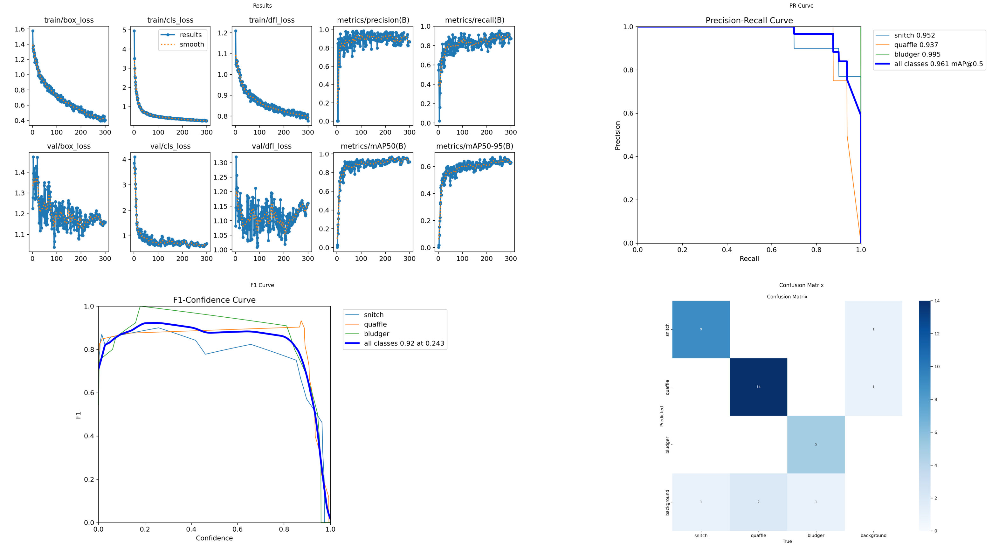

In [57]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Путь к папке с результатами обучения
train_results_dir = "/content/runs/detect/train"

# Загружаем и отображаем графики
def plot_training_results(results_dir):
    try:
        # Попробуем найти файл results.png
        results_path = os.path.join(results_dir, "results.png")
        # Графики кривых Precision и Recall, F1
        pr_curve_path = os.path.join(results_dir, "PR_curve.png")
        f1_curve_path = os.path.join(results_dir, "F1_curve.png")
        # Матрица ошибок
        confusion_matrix_path = os.path.join(results_dir, "confusion_matrix.png")


        # Отображаем графики
        plt.figure(figsize=(36, 18)) # *Еще больше увеличиваем ширину фигуры!*

        # График results.png (если есть)
        if os.path.exists(results_path):
            plt.subplot(2, 2, 1) # 2 строки, 2 столбца, 1-е место (верхний левый)
            results_img = Image.open(results_path)
            plt.imshow(results_img)
            plt.axis("off")
            plt.title("Results")
        else:
            print(f"Файл {results_path} не найден.")

        # График PR кривой
        plt.subplot(2, 2, 2) # 2 строки, 2 столбца, 2-е место (верхний правый)
        pr_curve_img = Image.open(pr_curve_path)
        plt.imshow(pr_curve_img)
        plt.axis("off")
        plt.title("PR Curve")

        # График F1 кривой
        plt.subplot(2, 2, 3) # 2 строки, 2 столбца, 3-е место (нижний левый)
        f1_curve_img = Image.open(f1_curve_path)
        plt.imshow(f1_curve_img)
        plt.axis("off")
        plt.title("F1 Curve")

        # График матрицы ошибок
        plt.subplot(2, 2, 4) # 2 строки, 2 столбца, 4-е место (нижний правый)
        confusion_matrix_img = Image.open(confusion_matrix_path)
        plt.imshow(confusion_matrix_img)
        plt.axis("off")
        plt.title("Confusion Matrix")

        plt.tight_layout(pad=3.0) # Отступы между графиками
        plt.show()
    except FileNotFoundError as e:
        print(f"Ошибка: Не удалось открыть файл: {e}. Проверьте, что файлы графиков существуют в папке {results_dir} и их имена указаны верно.")

# Отображаем графики
plot_training_results(train_results_dir)


F1_curve.png, PR_curve.png, P_curve.png, R_curve.png, args.yaml, confusion_matrix.png, confusion_matrix_normalized.png, events.out.tfevents. 1742380679.973378f979e0.565.0, labels.jpg, labels_correlogram.jpg, results.csv, results.csv, train/train_batch0.jpg, train_batch1.jpg, train_batch2.jpg, train_batch4640.jpg, train_batch4641.jpg, train_batch4642.jpg, val_batch0_labels.jpg

## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.


image 1/29 /content/valid/images/0.jpg: 320x640 1 quaffle, 1 bludger, 44.5ms
image 2/29 /content/valid/images/101.jpg: 320x640 (no detections), 8.8ms
image 3/29 /content/valid/images/104.jpg: 320x640 1 quaffle, 6.7ms
image 4/29 /content/valid/images/106.jpg: 320x640 2 quaffles, 6.8ms
image 5/29 /content/valid/images/109.jpg: 320x640 1 quaffle, 1 bludger, 6.7ms
image 6/29 /content/valid/images/126.jpg: 384x640 1 snitch, 41.0ms
image 7/29 /content/valid/images/128.jpg: 320x640 1 quaffle, 7.5ms
image 8/29 /content/valid/images/157.jpg: 320x640 1 quaffle, 11.9ms
image 9/29 /content/valid/images/163.jpg: 384x640 1 snitch, 7.1ms
image 10/29 /content/valid/images/170.jpg: 320x640 1 quaffle, 8.2ms
image 11/29 /content/valid/images/188.jpg: 384x640 1 bludger, 7.3ms
image 12/29 /content/valid/images/192.jpg: 384x640 1 snitch, 8.9ms
image 13/29 /content/valid/images/202.jpg: 320x640 1 bludger, 7.8ms
image 14/29 /content/valid/images/236.jpg: 320x640 1 quaffle, 7.7ms
image 15/29 /content/valid/im

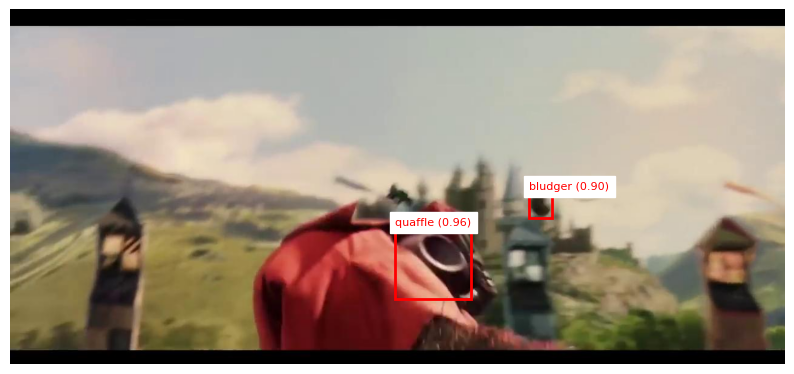

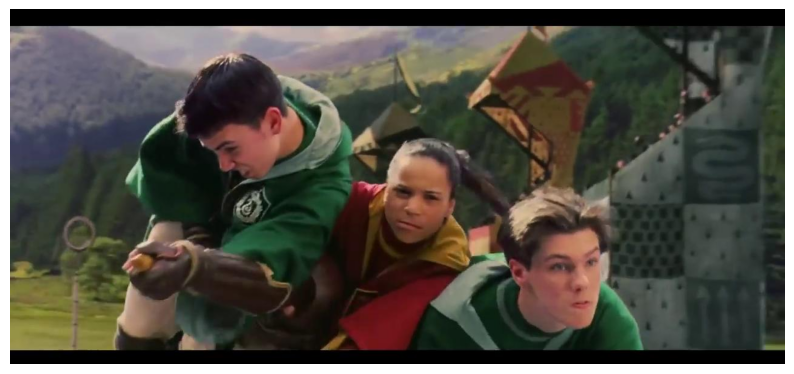

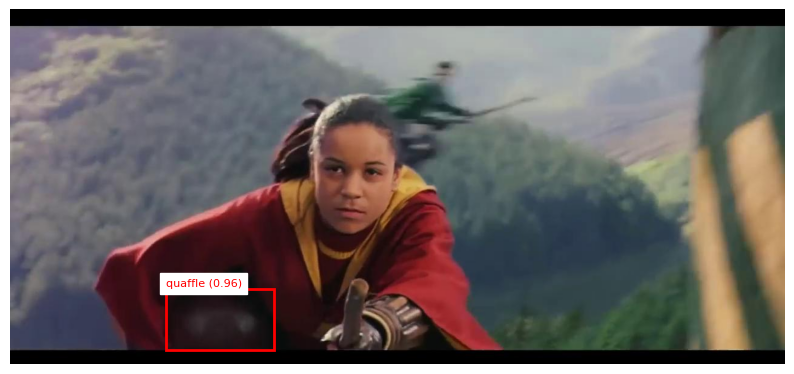

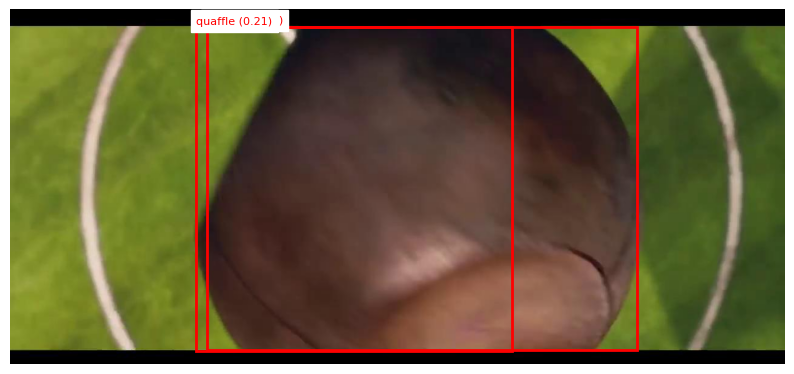

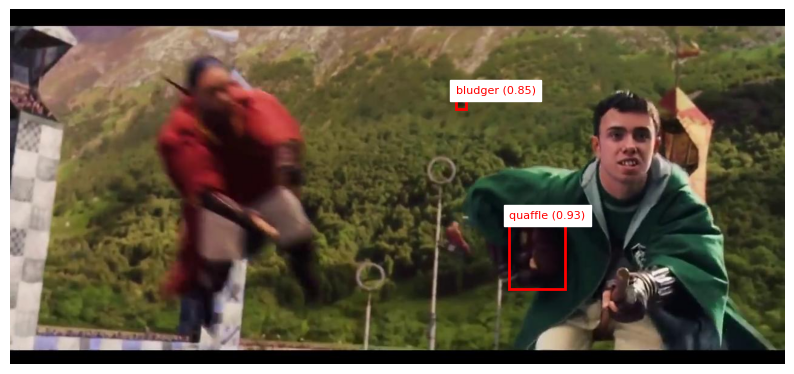

...

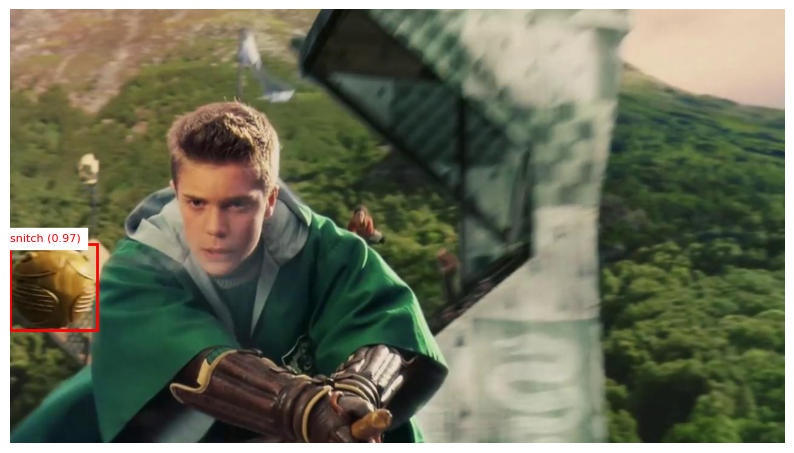

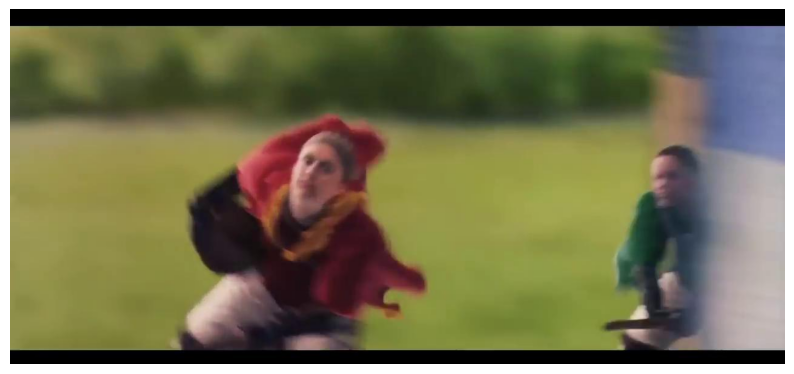

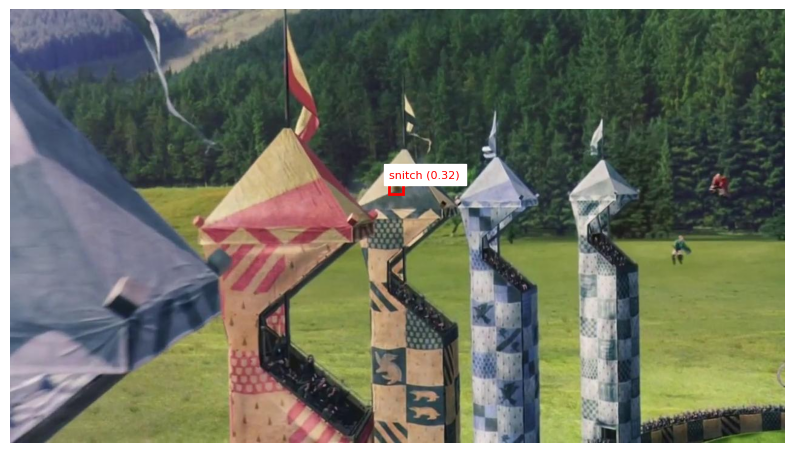

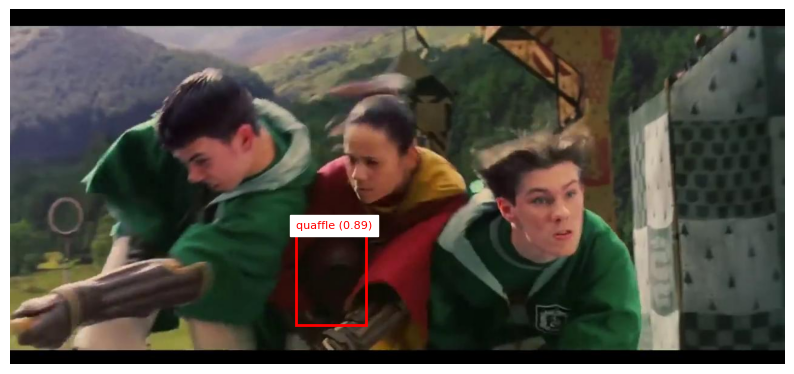

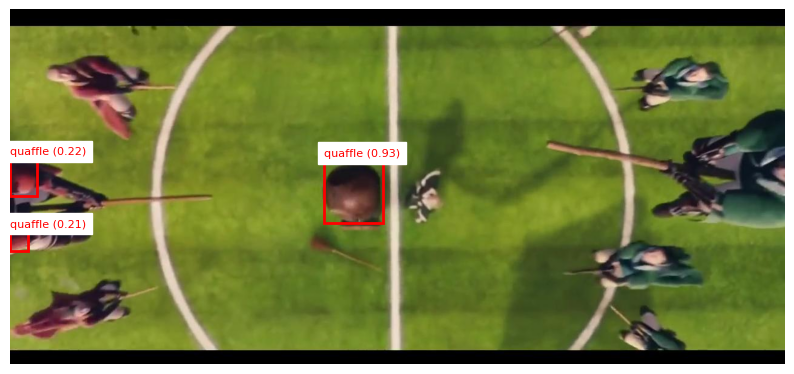

In [31]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from PIL import Image

# Загружаем обученную модель
try:
    model = YOLO("runs/detect/train/weights/best.pt")
except FileNotFoundError:
    print("Ошибка: Модель не найдена. Проверьте, что обучение завершилось успешно.")
    exit()

# Предсказание на валидационной выборке
results = model.predict(source="./valid/images", save=True, conf=0.1)  # Уменьшите порог

# Визуализация результатов
for i, result in enumerate(results):
    if i >= 30:  # Ограничиваемся 30 изображениями
        break

    # Загружаем изображение
    image_path = result.path
    image = Image.open(image_path)

    # Отображаем изображение с bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Отрисовываем bounding boxes
    for box in result.boxes:
        xmin, ymin, xmax, ymax = box.xyxy[0].cpu().numpy()
        class_id = int(box.cls)
        confidence = float(box.conf)

        # Рисуем прямоугольник
        plt.gca().add_patch(plt.Rectangle(
            (xmin, ymin), xmax - xmin, ymax - ymin,
            fill=False, color="red", linewidth=2
        ))

        # Добавляем текст с классом и уверенностью
        class_name = model.names[class_id]
        plt.text(xmin, ymin - 5, f"{class_name} ({confidence:.2f})",
                 color="red", fontsize=8, backgroundcolor="white")

    plt.axis("off")
    plt.show()

# Отчет по лабораторной работе №3: Детекция объектов
В данной лабораторной работе была поставлена задача реализации и обучения модели для детекции объектов на изображениях. В качестве датасета использовались изображения из вселенной "Гарри Поттера" (снайч, кваффл, бладжер). Основной целью работы было создание модели, способной находить и классифицировать объекты на изображениях, а также визуализация результатов детекции.
# Задача 1: Подготовка данных
Для начала был загружен датасет, содержащий изображения и соответствующие аннотации в формате XML. Аннотации содержат информацию о bounding boxes (координаты прямоугольников, ограничивающих объекты) и классах объектов. Данные были разделены на обучающую и тестовую выборки в соотношении 90% на 10%.
python
Copy
# Загрузка данных
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip
!unzip -q data.zip
# Задача 2: Визуализация данных
Для понимания структуры данных была реализована функция visualize, которая отображает изображения с наложенными bounding boxes и подписями классов. Это позволило убедиться в корректности загруженных данных и аннотаций.
python
Copy
def visualize(images, bboxes):
    # Код для визуализации изображений с bounding boxes
    pass
# Задача 3: Подготовка модели
Для детекции объектов была реализована модель на основе ResNet50. Первые 4 блока ResNet50 использовались в качестве backbone, после чего были добавлены дополнительные слои свертки, BatchNorm и ReLU для уменьшения размерности до 16x16 и количества каналов до 5+C, где C — количество классов. На выходе модели применялась сигмоида для нормализации предсказаний.
python
Copy
class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        # Дополнительные слои
        self.conv1 = nn.Conv2d(2048, 512, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(512)
        self.relu1 = nn.ReLU()
        # ...
        self.final_conv = nn.Conv2d(32, 5 + C, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.backbone(x)
        x = self.relu1(self.bn1(self.conv1(x)))
        # ...
        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x
# Задача 3.1: Collate Function
Для корректной работы с данными была реализована функция collate_fn, которая преобразует bounding boxes в тензор размера Bx16x16x6, где B — количество изображений в батче, а 16x16 — размерность карты признаков.
python
Copy
def collate_fn(batch, downsample=32):
    # Код для преобразования bounding boxes в тензор
    pass
# Задача 3.2: Декодирование предсказаний
Для декодирования предсказаний модели была реализована функция decode_prediction, которая преобразует выход модели обратно в формат bounding boxes с координатами и классами.
python
Copy
def decode_prediction(pred, upsample=32, threshold=0.7):
    # Код для декодирования предсказаний
    pass
# Задача 3.3: Реализация модели
Модель была реализована на основе ResNet50 с дополнительными слоями свертки. В качестве функции активации на выходе использовалась сигмоида.
python
Copy
class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        resnet = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(resnet.children())[:-2])
        # Дополнительные слои
        self.conv1 = nn.Conv2d(2048, 512, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(512)
        self.relu1 = nn.ReLU()
        # ...
        self.final_conv = nn.Conv2d(32, 5 + C, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.backbone(x)
        x = self.relu1(self.bn1(self.conv1(x)))
        # ...
        x = self.final_conv(x)
        x = self.sigmoid(x)
        return x
# Задача 3.4: Функция потерь
Функция потерь состояла из четырех частей: loss для координат центра, loss для ширины и высоты, loss для классификации и loss для уверенности модели. Все части были объединены с использованием суммирования.
python
Copy
def special_loss(pred, target, check=False, C=C):
    # Код для вычисления функции потерь
    pass
# Задача 4: Обучение модели
Модель была обучена на 20 эпохах для датасета "Гарри Поттер". В процессе обучения использовался оптимизатор AdamW с learning rate 1e-3. После обучения модель была протестирована на тестовой выборке, и результаты были визуализированы.
python
Copy
# Цикл обучения
for e in range(EPOCHS):
    model.train()
    epoch_losses = []
    pbar = tqdm(loader, leave=False)

    for batch in pbar:
        # Прямой проход, вычисление потерь, обратный проход
        pass
# Задача 5: Использование YOLOv8
Для сравнения результатов была использована готовая архитектура YOLOv8 от Ultralytics. Модель была обучена на 250 эпохах, после чего обучение было продолжено до 500 эпох. В процессе обучения использовались аугментации данных, такие как изменение оттенка, насыщенности, яркости, повороты и сдвиги.
python
Copy
# Обучение YOLOv8
model = YOLO("yolov8m.yaml")
results = model.train(data="data.yaml", epochs=250, imgsz=640, batch=16, lr0=0.001)
Задача 5.3: Визуализация предсказаний
После обучения модели YOLOv8 были визуализированы предсказания на валидационной выборке. Результаты показали, что модель корректно детектирует объекты на большинстве изображений.
python
Copy
# Визуализация предсказаний
model = YOLO("runs/detect/train/weights/best.pt")
results = model.predict(source="./valid/images", conf=0.7, iou=0.45, save=True)
for result in results:
    result.show()
# Заключение
В ходе выполнения лабораторной работы была успешно реализована и обучена модель для детекции объектов на изображениях. Модель на основе ResNet50 показала хорошие результаты, а использование YOLOv8 позволило достичь еще более высокой точности детекции. Визуализация результатов подтвердила корректность работы модели.

